### Install Required Packages

We would be running `Stable Diffusion 2` so enable `GPU` under `View Resources > Change runtime type`

In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-b55fd566-042e-5256-cc21-47b0e7550fa1)


In [ ]:
%%capture
!pip install diffusers
!pip install accelerate
!pip install daam==0.0.12
!pip install git+https://github.com/RishiDarkDevil/daam-i2i.git
!pip install git+https://github.com/RishiDarkDevil/TITAN.git

### Import Necessary Libraries

We will load the necessary libraries required for generating DAAM outputs for input prompts.

In [ ]:
# General
import requests
from io import BytesIO

# Plotting
from matplotlib import pyplot as plt

# Data Handling
import numpy as np

# Image Processing
import cv2
from PIL import Image

# Image Generation
from diffusers import StableDiffusionImg2ImgPipeline

# Heatmap generation
import daam
import daami2i

# Model
import torch

# annotations
import titan

### Load Model

In [ ]:
DEVICE = 'cuda' # device

Now, let's load the `stabilityai/stable-diffusion-2-base` diffusion model.

In [ ]:
STRENGTH = 0.3

In [ ]:
model = StableDiffusionImg2ImgPipeline.from_pretrained('stabilityai/stable-diffusion-2-base')
model = model.to(DEVICE) # Set it to something else if needed, make sure DAAM supports that

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

### DAAM Image Attention

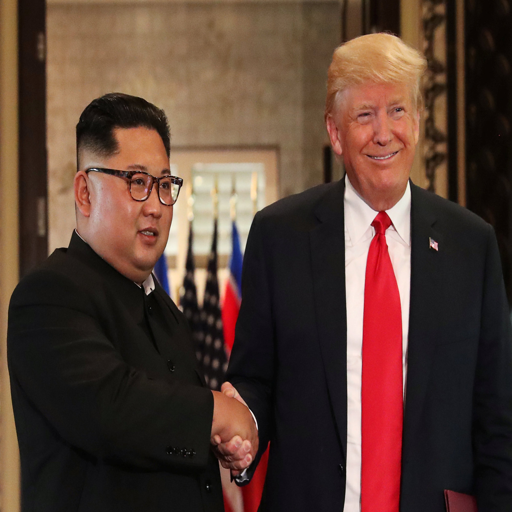

In [ ]:
# Image
url = "https://www.japantimes.co.jp/wp-content/uploads/2018/06/f-nkflip-a-20180624.jpg"

response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB")
# init_img = Image.open('img.png').convert("RGB")
init_img = init_img.resize((512, 512))
init_img

In [ ]:
prompt = ['Kim Jong-un handshake with Trump']
objects = ['Kim Jong-un', 'Trump']

In [ ]:
# processed_prompt = titan.PromptHandler().clean_prompt(prompt)

In [ ]:
# processed_prompt

In [ ]:
with daam.trace(model) as daam_trc:
  with daami2i.trace(model) as daami2i_trc:
    output_image = model(prompt=prompt, init_image=init_img, strength=STRENGTH, guidance_scale=7.5).images[0]
    image_global_heat_map = daami2i_trc
    word_global_heat_map = daam_trc

  0%|          | 0/16 [00:00<?, ?it/s]

In [ ]:
output_image[0]

In [ ]:
image_global_heat_map = image_global_heat_map.compute_global_heat_map([1], None, None)
word_global_heat_map = word_global_heat_map.compute_global_heat_map(None, None, None)

In [ ]:
def diffuse_from_pixel(pixel_id, num_diffuse, thresh = 0):
  epicenter = image_global_heat_map.compute_pixel_heat_map(pixel_id).heatmap
  plt.imshow(epicenter) # Initial Pixel Heatmap
  plt.show()
  epicenter[epicenter < epicenter.min()+thresh] = 0
  for _ in range(num_diffuse):
    epicenter = image_global_heat_map.compute_guided_heat_map(epicenter).heatmap
    plt.imshow(epicenter)
    plt.show()
    epicenter[epicenter < epicenter.min()+thresh] = 0

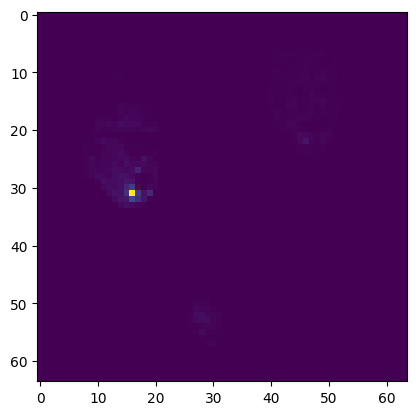

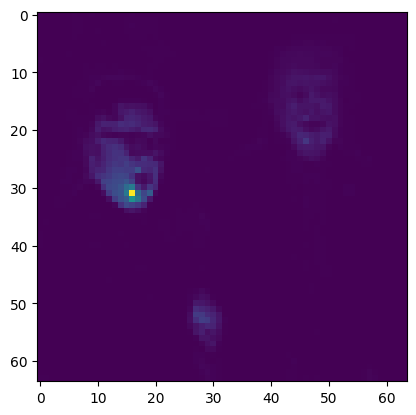

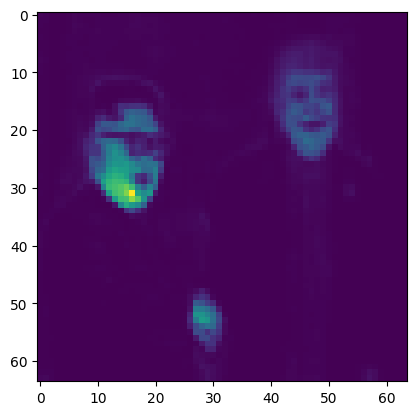

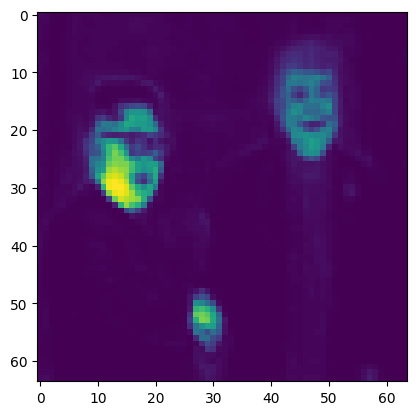

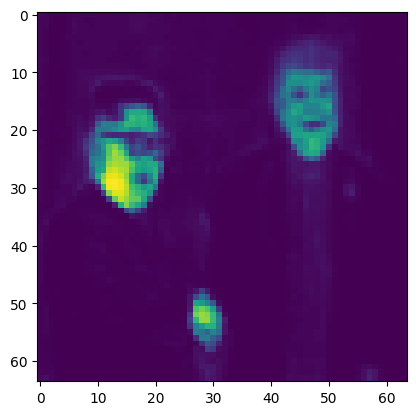

...

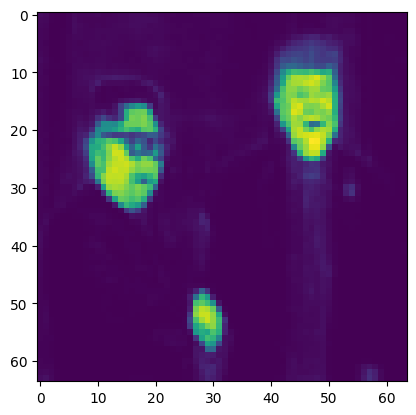

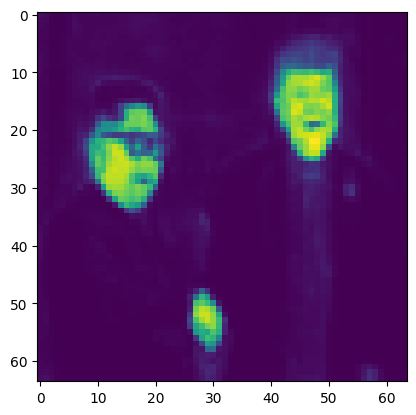

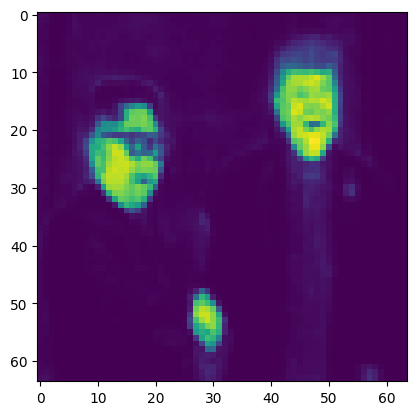

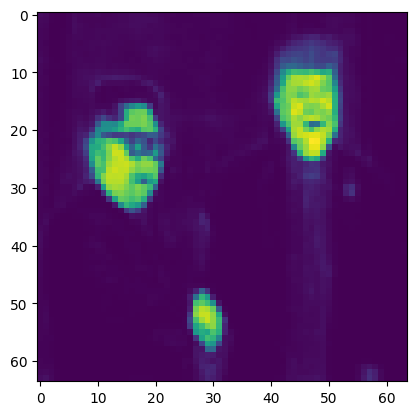

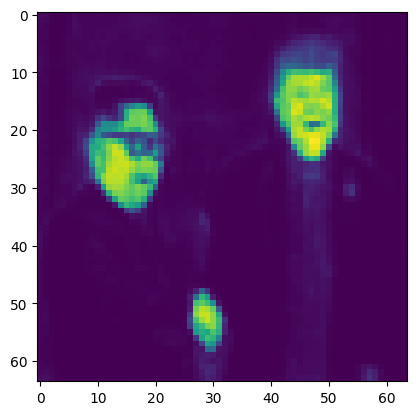

In [ ]:
NUM_DIFFUSE = 20
PIXEL_ID = 2048 - 48 # Enter Pixel ID
diffuse_from_pixel(PIXEL_ID, NUM_DIFFUSE, 0.02)

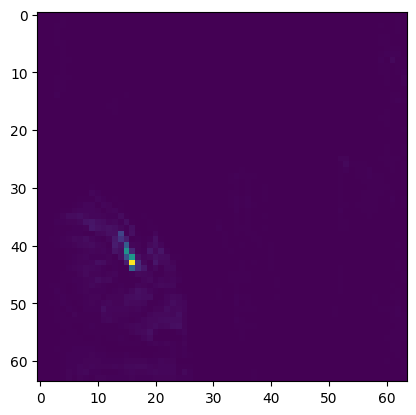

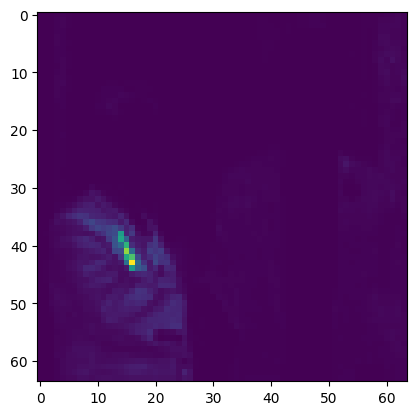

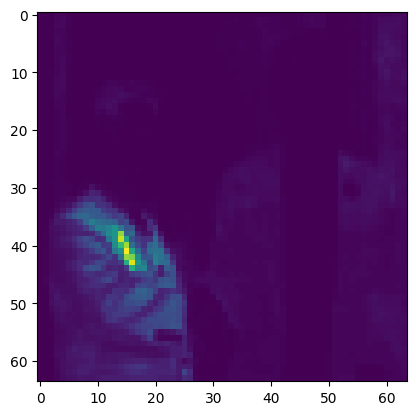

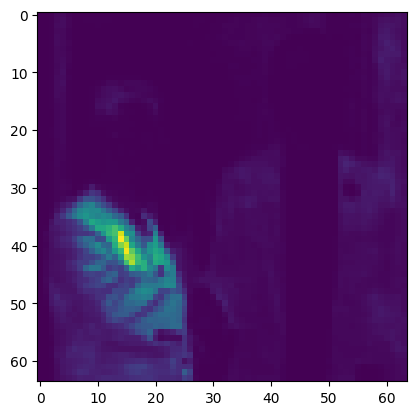

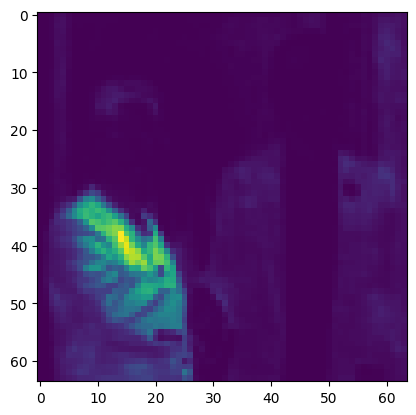

...

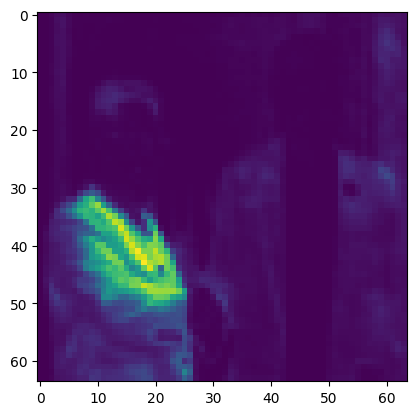

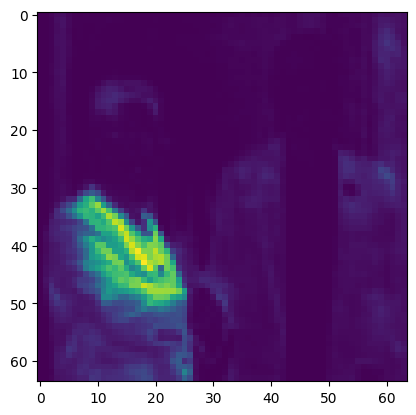

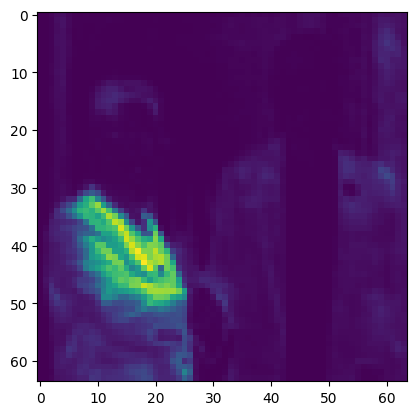

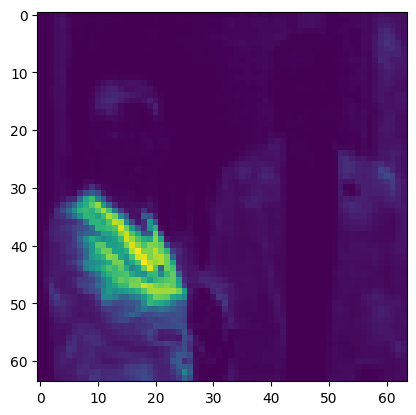

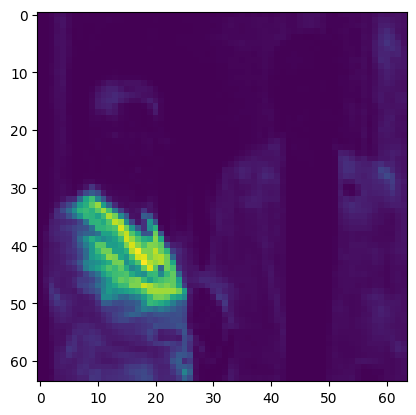

In [ ]:
NUM_DIFFUSE = 20
PIXEL_ID = 2048 - 48 + 64 * 12 # Enter Pixel ID
diffuse_from_pixel(PIXEL_ID, NUM_DIFFUSE, 0.02)

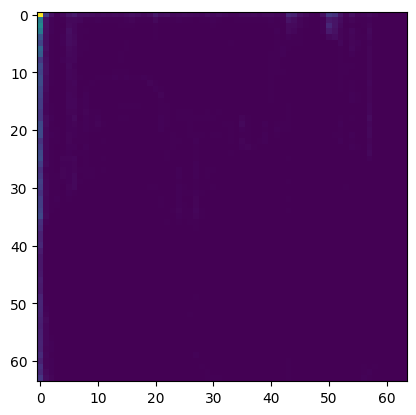

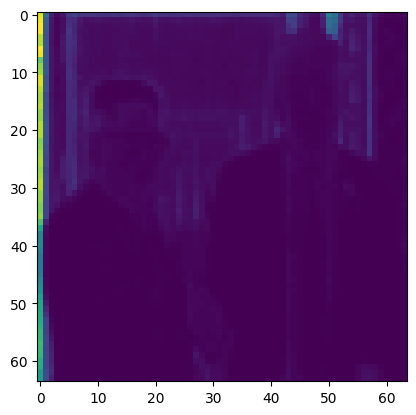

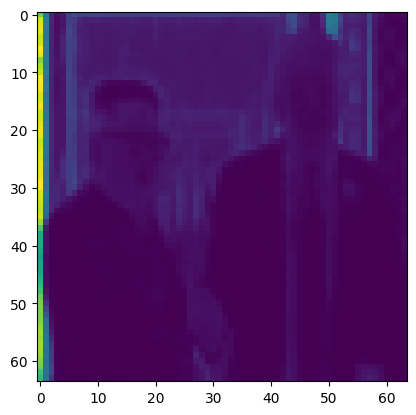

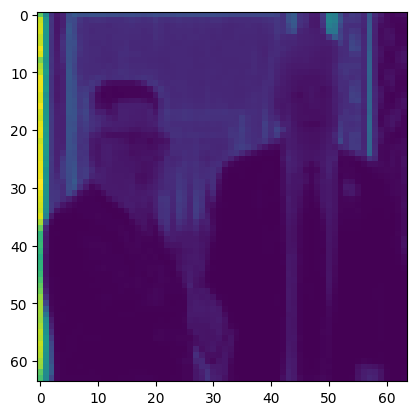

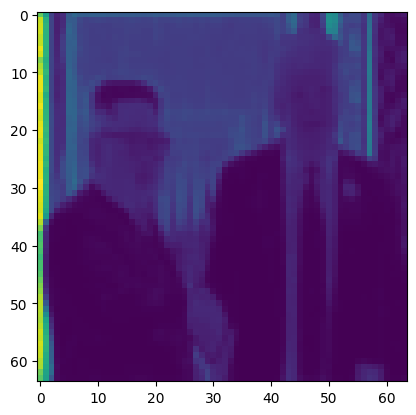

...

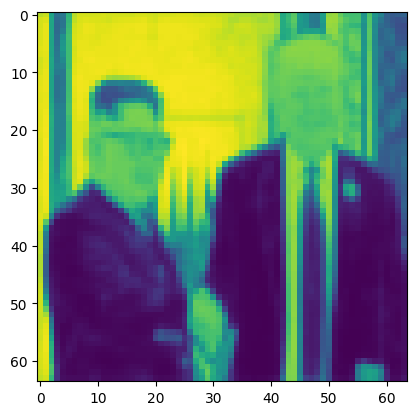

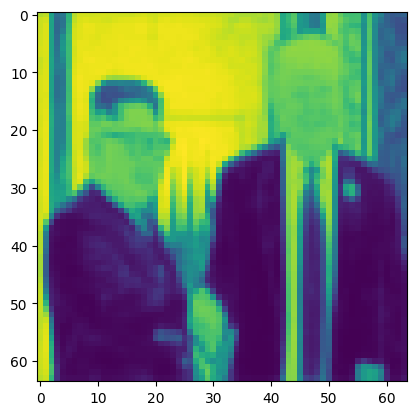

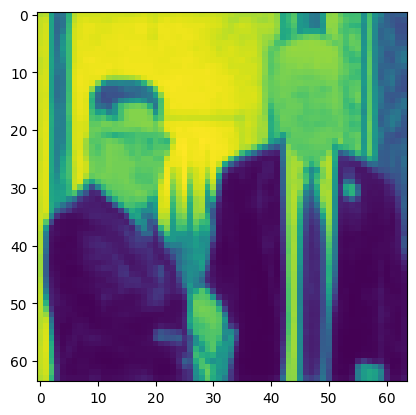

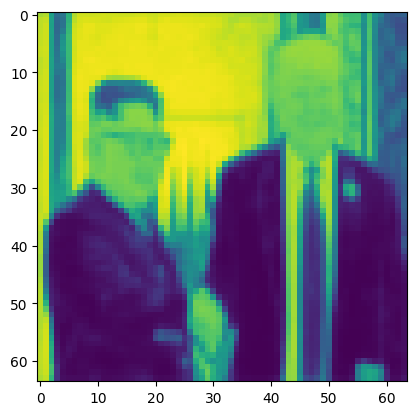

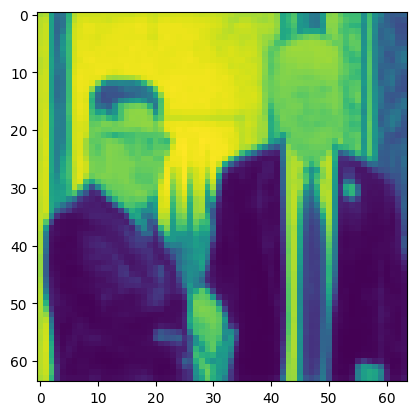

In [ ]:
NUM_DIFFUSE = 20
PIXEL_ID = 0 # Enter Pixel ID
diffuse_from_pixel(PIXEL_ID, NUM_DIFFUSE, 0.001)

In [ ]:
D2_list = list()
for pix_id in range(4096):
  D2_list.append(image_global_heat_map.compute_pixel_heat_map(pix_id).heatmap)

In [ ]:
D2_heatmap = torch.stack(D2_list)

In [ ]:
D2_image_heat_map = daami2i.GlobalHeatMap(D2_heatmap, 4096)

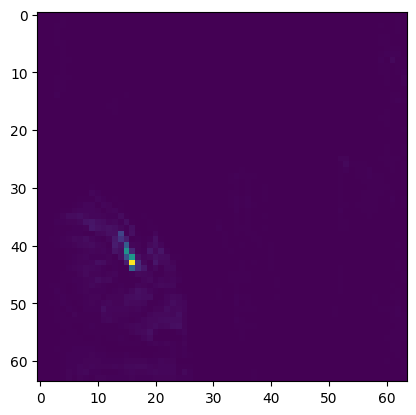

In [ ]:
plt.imshow(D2_image_heat_map.compute_pixel_heat_map(2048 - 48 + 64 * 12).heatmap.cpu())

In [ ]:
def diffuse_from_pixel(pixel_id, num_diffuse, thresh = 0):
  diffuse_epicenter = image_global_heat_map
  epicenter = diffuse_epicenter.compute_pixel_heat_map(pixel_id).heatmap
  plt.imshow(epicenter) # Initial Pixel Heatmap
  plt.show()
  epicenter[epicenter < epicenter.min()+thresh] = 0
  for _ in range(num_diffuse):

    degree_diffuse_list = list()
    for pix_id in range(4096):
      degree_diffuse_list.append(diffuse_epicenter.compute_pixel_heat_map(pix_id).heatmap)
    degree_diffuse_heatmap = torch.stack(degree_diffuse_list)
    diffuse_epicenter = daami2i.GlobalHeatMap(degree_diffuse_heatmap, 4096)
    
    epicenter = diffuse_epicenter.compute_guided_heat_map(epicenter).heatmap
    plt.imshow(epicenter)
    plt.show()
    epicenter[epicenter < epicenter.min()+thresh] = 0

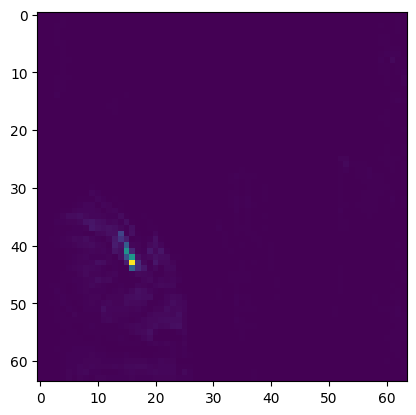

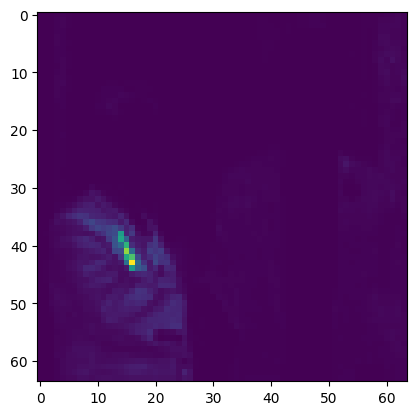

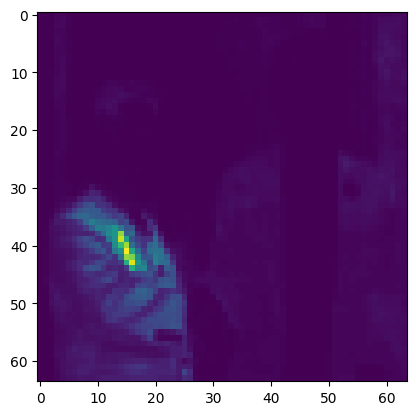

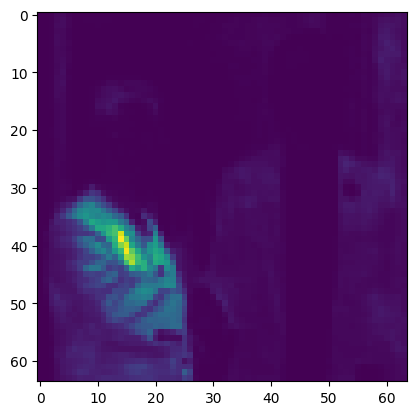

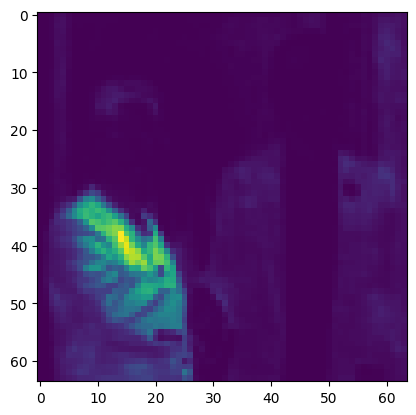

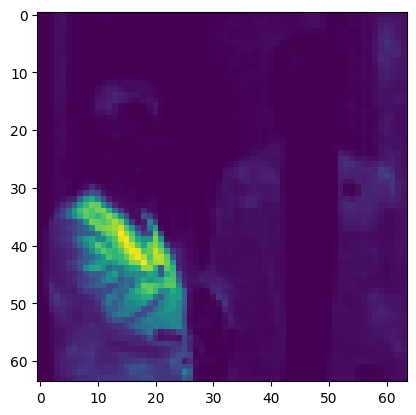

In [ ]:
NUM_DIFFUSE = 5
PIXEL_ID = 2048 - 48 + 64 * 12 # Enter Pixel ID
diffuse_from_pixel(PIXEL_ID, NUM_DIFFUSE, 0.02)

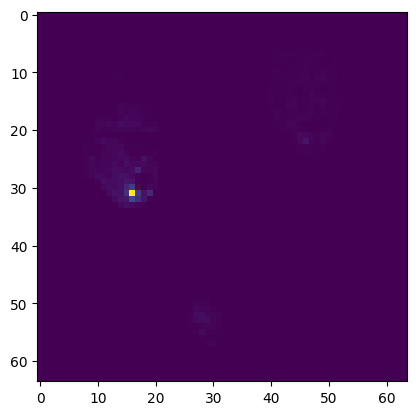

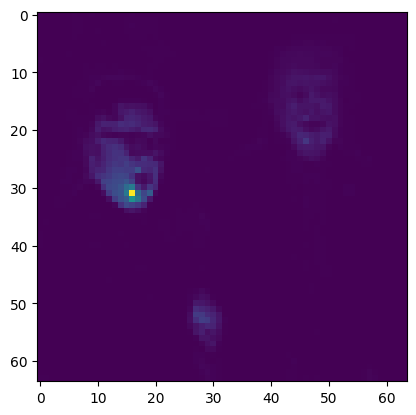

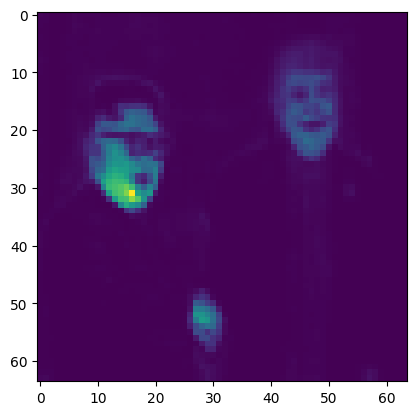

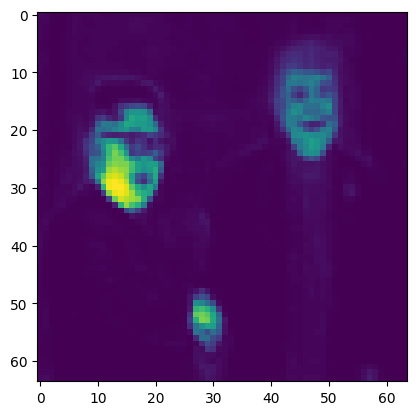

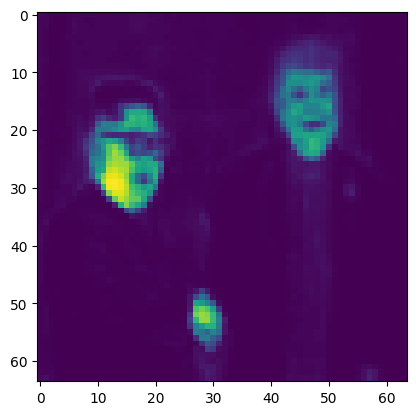

...

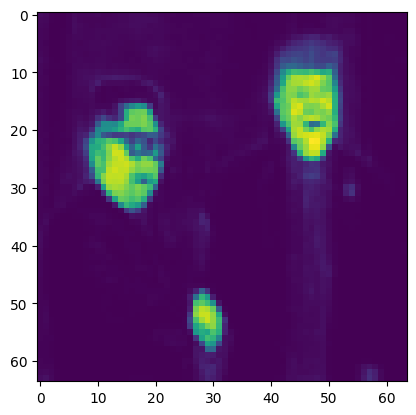

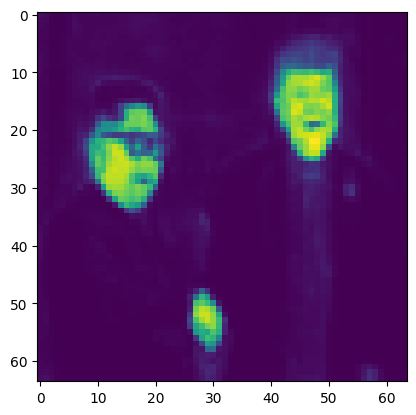

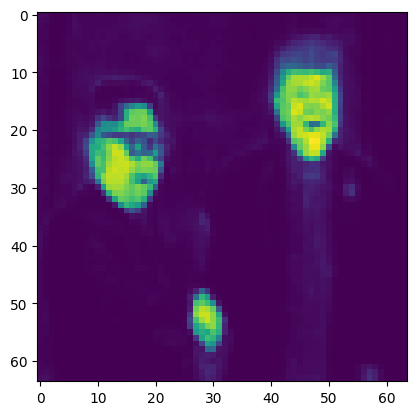

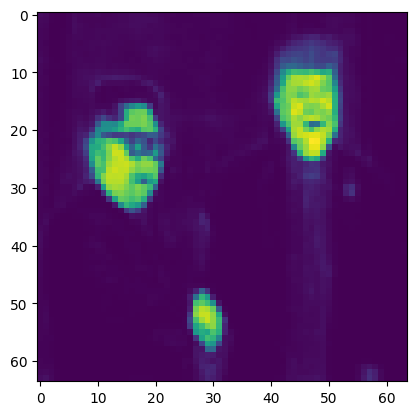

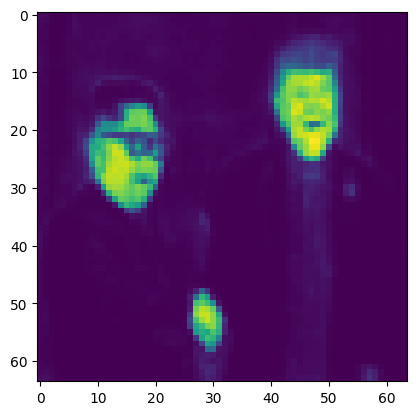

In [ ]:
NUM_DIFFUSE = 20
PIXEL_ID = 2048 - 48 # Enter Pixel ID
diffuse_from_pixel(PIXEL_ID, NUM_DIFFUSE, 0.02)

### Visualize Heatmaps

In [ ]:
annotations = list()
object_annotator = titan.ObjectAnnotator()

In [ ]:
# for i, word in enumerate(processed_prompt[0][1]):
#   # Compute heatmap for a non-stopword
#   word_heatmap = word_global_heat_map.compute_word_heat_map(word).expand_as(output_image[0]).numpy()

#   # Annotate the Word Heatmap for current word
#   anns = object_annotator.wordheatmap_to_annotations(
#     word_heatmap, 100*i, 1, i
#     )

#   annotations.append(anns)

for i, word in enumerate(objects):
  # Compute heatmap for a non-stopword
  word_heatmap = word_global_heat_map.compute_word_heat_map(word).expand_as(output_image[0]).numpy()

  # Annotate the Word Heatmap for current word
  anns = object_annotator.wordheatmap_to_annotations(
    word_heatmap, 100*i, 1, i
    )

  annotations.append(anns)

In [ ]:
len(annotations)

2

In [ ]:
len(annotations[0])

3

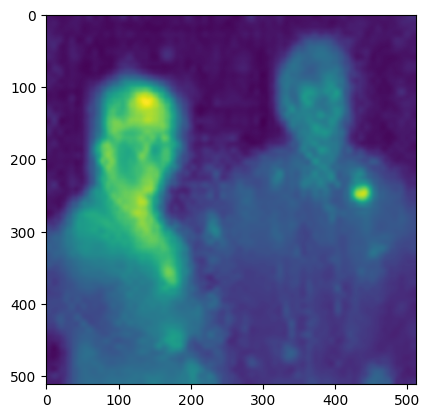

In [ ]:
# plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][0]).expand_as(output_image[0]).numpy())
plt.imshow(word_global_heat_map.compute_word_heat_map(objects[0]).expand_as(output_image[0]).numpy())

In [ ]:
heatmaps = list()
for k in range(len(annotations[0])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[0][k]['segmentation'][0][i], annotations[0][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[0][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

In [ ]:
heatmap = np.mean(np.concatenate(heatmaps), 0)

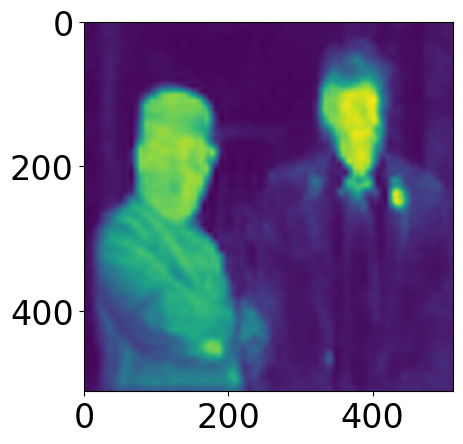

In [ ]:
plt.imshow(heatmap)

In [ ]:
plt.imshow(heat_map.squeeze().cpu().numpy(), cmap='jet', vmin=0.0, vmax=1.0)

In [ ]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(objects[0])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap)

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap.expand_as(output_image[0]).numpy() * 255, dtype = np.uint8)    

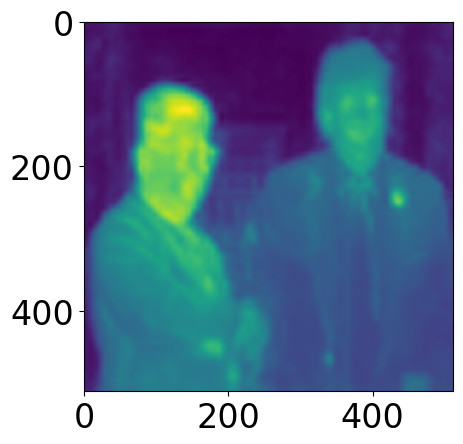

In [ ]:
plt.imshow(heatmap)

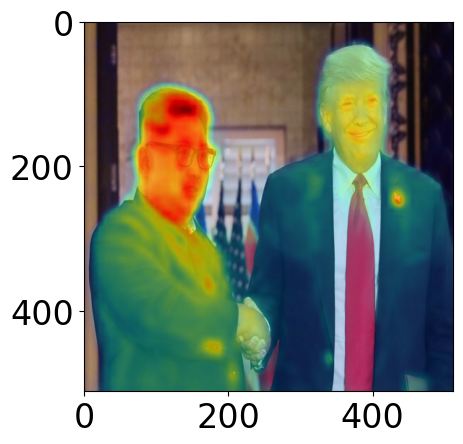

In [ ]:
pixel_heatmap.plot_overlay(init_img)

In [ ]:
# Combining both Contours and Weighted

inner_pix_list = list()
for k in range(len(annotations[0])):
  pts = [[annotations[0][k]['segmentation'][0][i], annotations[0][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[0][k]['segmentation'][0]), 2)]
  pts = np.array(np.array(pts) * image_global_heat_map.latent_w / 512, np.int32)
  pts = pts.reshape((-1,1,2))
  inner_pixs = list()
  for i in range(64):
    for j in range(64):
      dist = cv2.pointPolygonTest(pts, (i, j), False)
      if dist == 1.0:
        inner_pixs.append((j*image_global_heat_map.latent_w) + i)
  inner_pix_list.append(inner_pixs)

# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(objects[0])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for inner_pixs in inner_pix_list:
  for pix_id in inner_pixs:
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(pix_id).heatmap.cpu() * word_heat.heatmap.cpu()[pix_id//image_global_heat_map.latent_w][pix_id%image_global_heat_map.latent_w].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

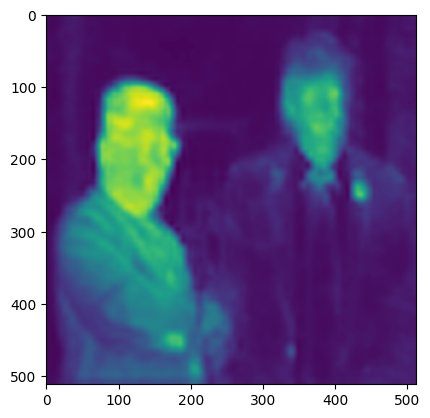

In [ ]:
plt.imshow(heatmap)

In [ ]:
len(annotations[1])

1

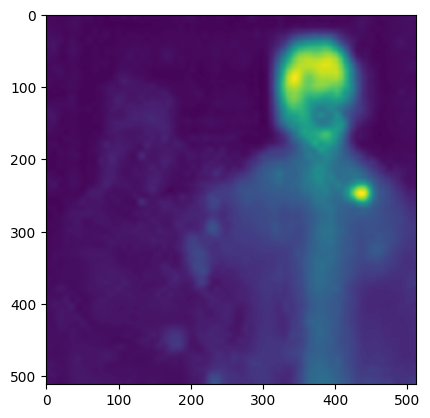

In [ ]:
# plt.imshow(word_global_heat_map.compute_word_heat_map(processed_prompt[0][1][1]).expand_as(output_image[0]).numpy())
plt.imshow(word_global_heat_map.compute_word_heat_map(objects[1]).expand_as(output_image[0]).numpy())

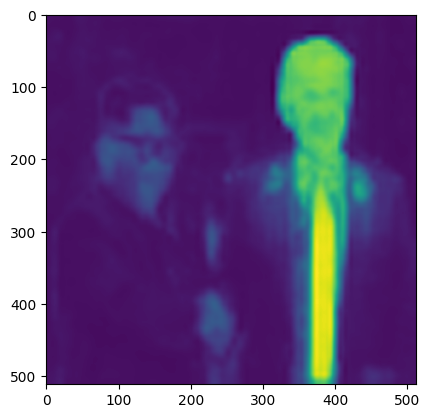

In [ ]:
heatmaps = list()
for k in range(len(annotations[1])):
  # Compute heatmap for inner pixels for contour boundary specified
  pixel_heatmap = image_global_heat_map.compute_contour_heat_map(
      [[annotations[1][k]['segmentation'][0][i], annotations[1][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[1][k]['segmentation'][0]), 2)], 
      512, 512).expand_as(output_image[0]).numpy()

  # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
  heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)

  heatmaps.append(heatmap[np.newaxis, :, :])

# computing mean of heatmaps
heatmap = np.mean(np.concatenate(heatmaps), 0)

# Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(heatmap, dtype = np.uint8)

plt.imshow(heatmap)

In [ ]:
# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(objects[1])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for i in range(image_global_heat_map.latent_h):
  for j in range(image_global_heat_map.latent_w):
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(image_global_heat_map.latent_w * i + j).heatmap.cpu() * word_heat.heatmap.cpu()[i][j].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap)

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap.expand_as(output_image[0]).numpy() * 255, dtype = np.uint8)    

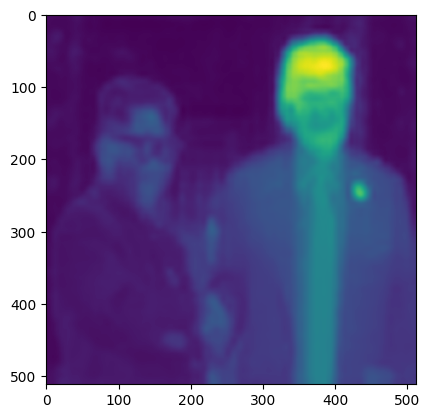

In [ ]:
plt.imshow(heatmap)

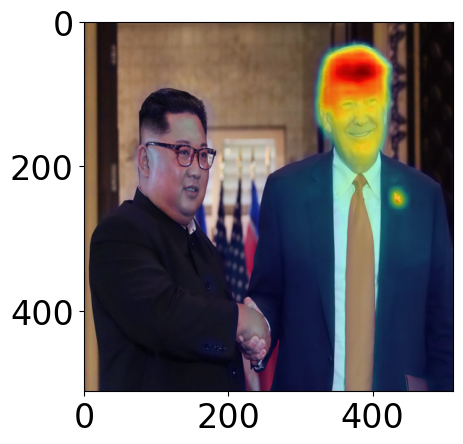

In [ ]:
pixel_heatmap.plot_overlay(init_img)

In [ ]:
# Combining both Contours and Weighted

inner_pix_list = list()
for k in range(len(annotations[1])):
  pts = [[annotations[1][k]['segmentation'][0][i], annotations[1][k]['segmentation'][0][i+1]] for i in range(0, len(annotations[1][k]['segmentation'][0]), 2)]
  pts = np.array(np.array(pts) * image_global_heat_map.latent_w / 512, np.int32)
  pts = pts.reshape((-1,1,2))
  inner_pixs = list()
  for i in range(64):
    for j in range(64):
      dist = cv2.pointPolygonTest(pts, (i, j), False)
      if dist == 1.0:
        inner_pixs.append((j*image_global_heat_map.latent_w) + i)
  inner_pix_list.append(inner_pixs)

# word_heatmap
word_heat = word_global_heat_map.compute_word_heat_map(objects[1])

# To store weighted average of all the heatmaps with weights as the text heatmap pixel weights
pixel_heatmap = torch.zeros((image_global_heat_map.latent_h, image_global_heat_map.latent_w))

for inner_pixs in inner_pix_list:
  for pix_id in inner_pixs:
    pixel_heatmap += image_global_heat_map.compute_pixel_heat_map(pix_id).heatmap.cpu() * word_heat.heatmap.cpu()[pix_id//image_global_heat_map.latent_w][pix_id%image_global_heat_map.latent_w].item() ## word_heat is large need to cover it

pixel_heatmap /= word_heat.heatmap.cpu().sum().item()

pixel_heatmap = daami2i.PixelHeatMap(pixel_heatmap).expand_as(output_image[0]).numpy()

# # Casting heatmap from 0-1 floating range to 0-255 unsigned 8 bit integer
heatmap = np.array(pixel_heatmap * 255, dtype = np.uint8)    

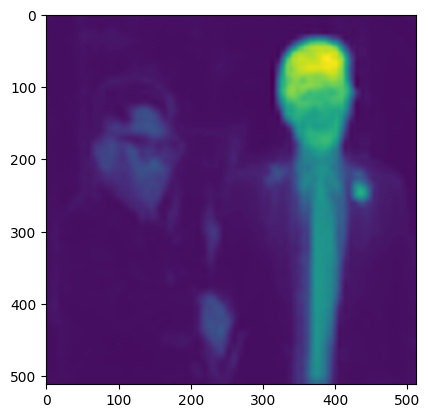

In [ ]:
plt.imshow(heatmap)

### Object Detections

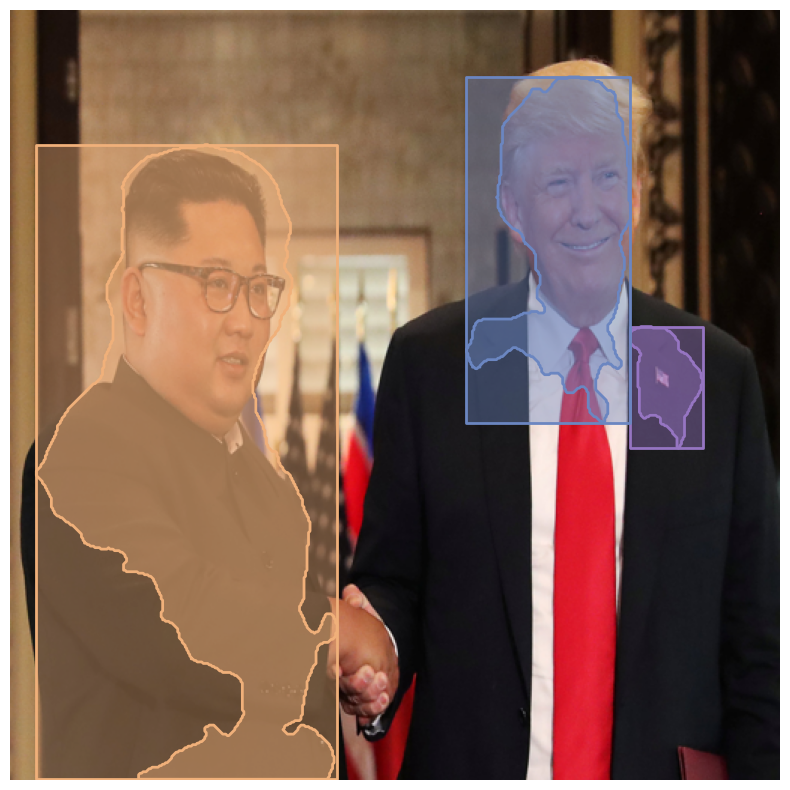

In [ ]:
# Word Heatmap Version - Kim
object_annotator.show_annotations(np.asarray(init_img), annotations[0])

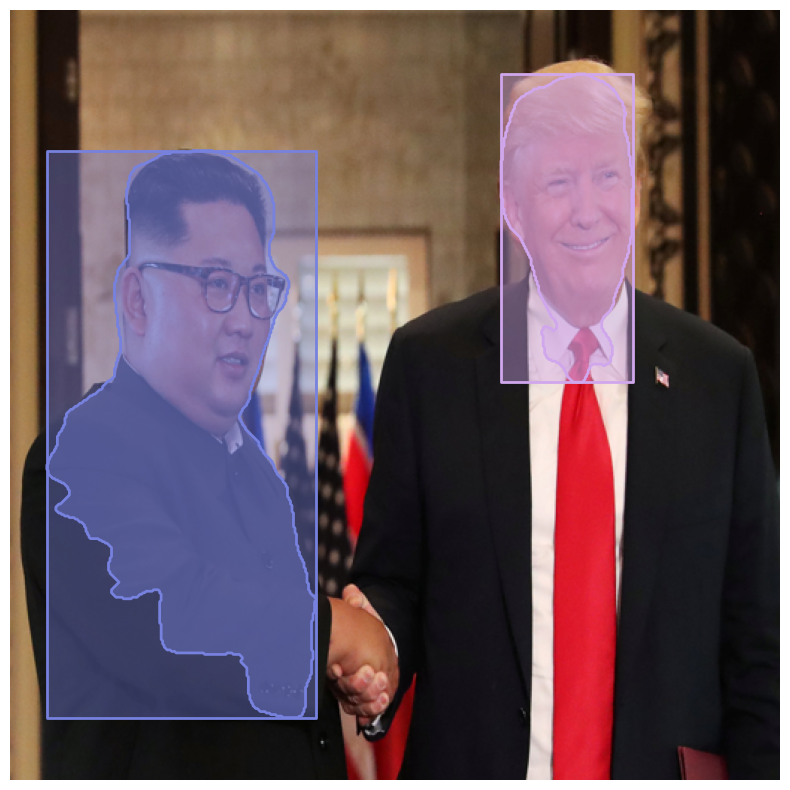

In [ ]:
# Image Heatmap Version - Kim (Non Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))

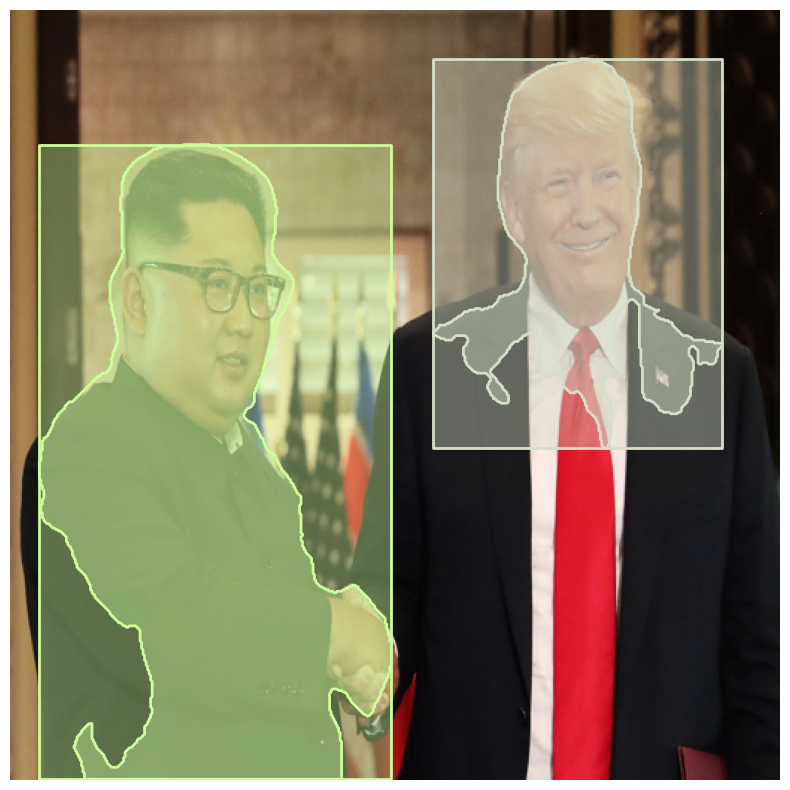

In [ ]:
# Image Heatmap Version - Kim (Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))

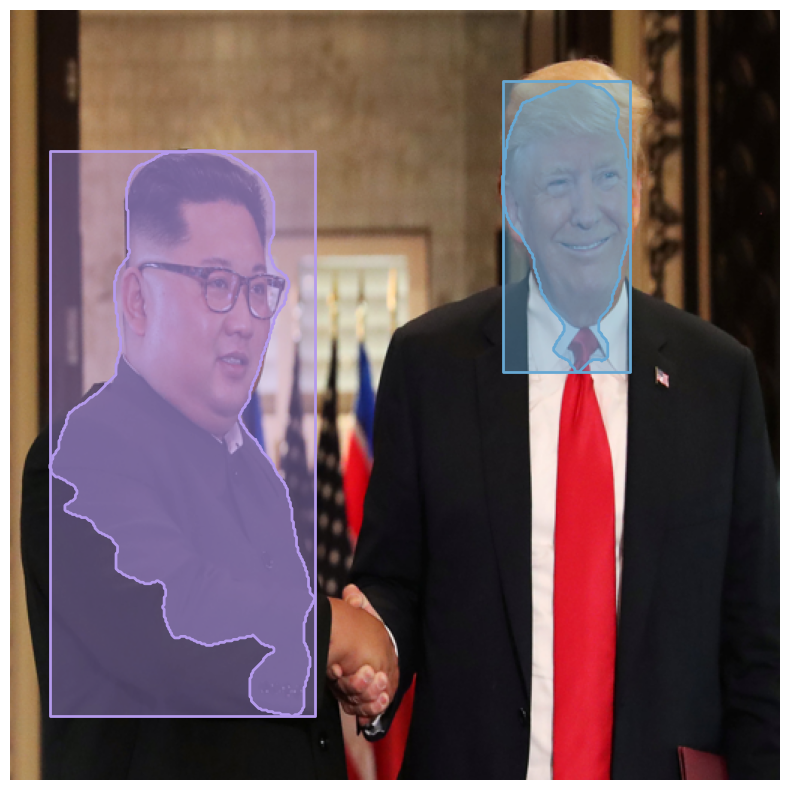

In [ ]:
# Image Heatmap Version - Kim (Non-Weighted + Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))

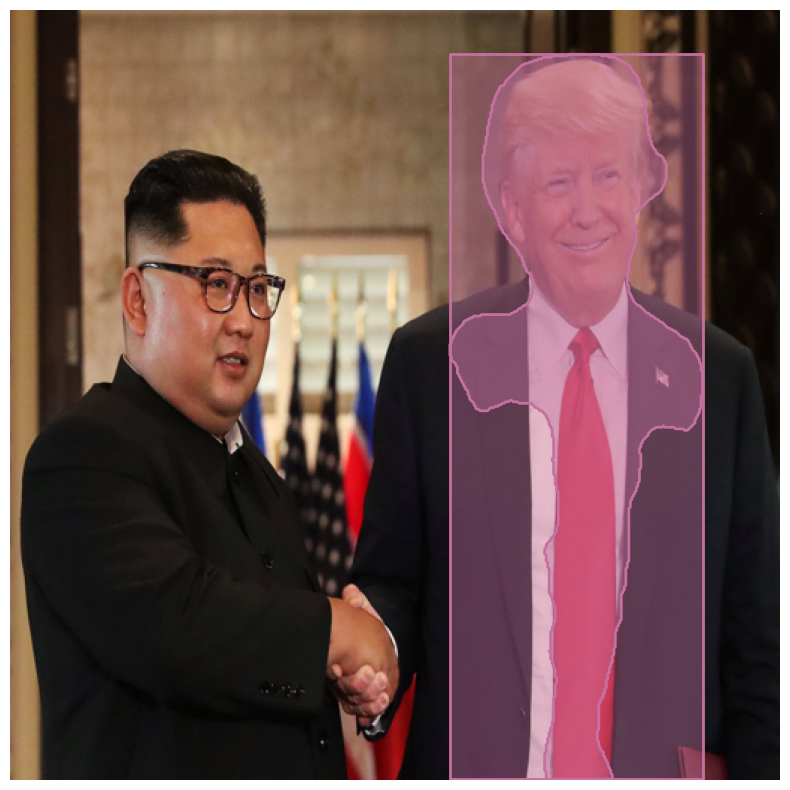

In [ ]:
# Word Heatmap Version - Trump
object_annotator.show_annotations(np.asarray(init_img), annotations[1])

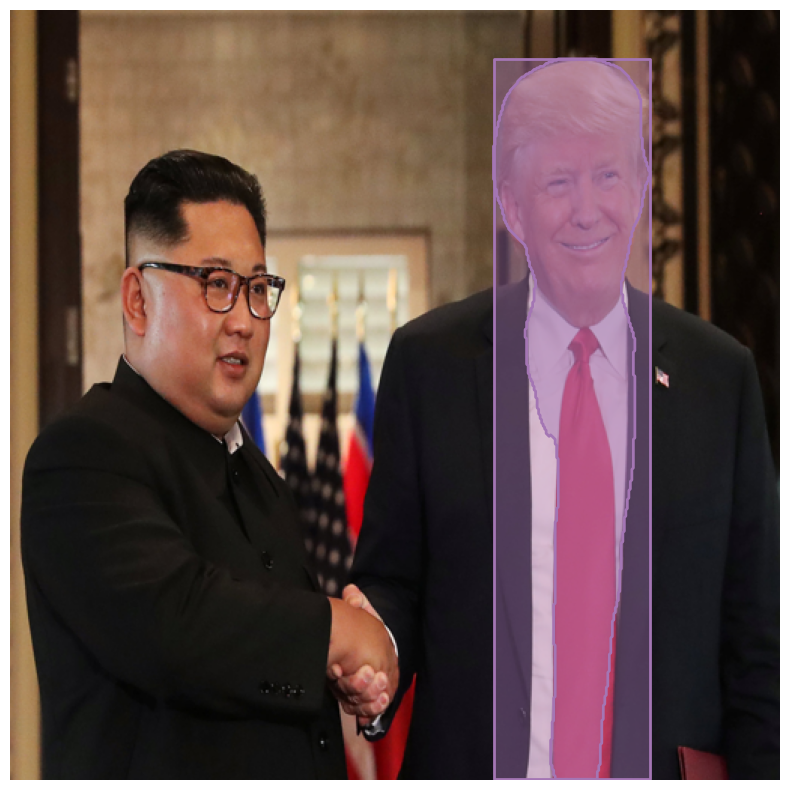

In [ ]:
# Image Heatmap Version - Trump (Non-Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))

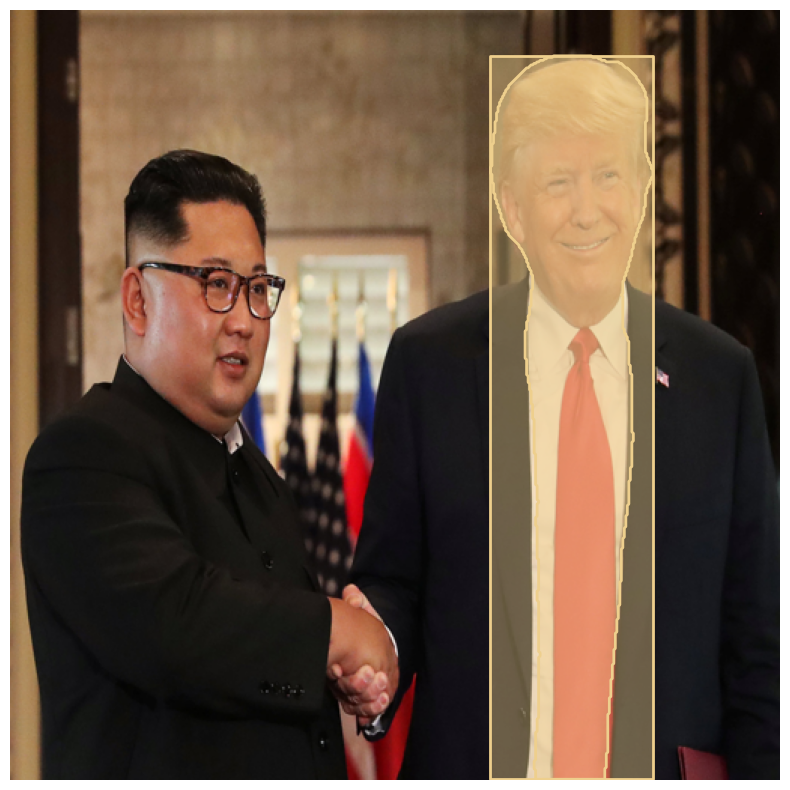

In [ ]:
# Image Heatmap Version - Trump (Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))

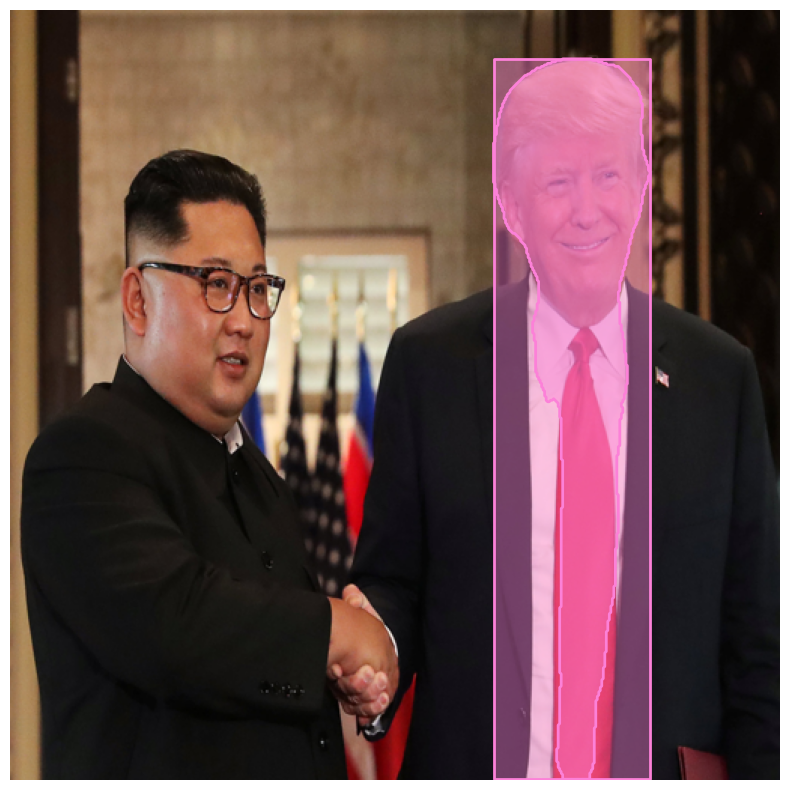

In [ ]:
# Image Heatmap Version - Trump (Non-Weighted + Weighted)
object_annotator.show_annotations(np.asarray(init_img), object_annotator.wordheatmap_to_annotations(heatmap/255))